In [1]:
import os
import sys
import numpy as np

sys.path.insert(1, os.path.dirname(os.getcwd()) + "\\src")
from DataPreprocessing import Preprocess, FeaturePreprocess
from DataProcessing import ModelTuning, ModelValidating, save_file, load_file
from ModelExplainability import TabularExplainer
from Main import preprocess_features, preprocess_data, preprocess_data,create_estimators ,validate_estimators, get_x_y_set, get_n_best, save, load

In [2]:
FILE_NAME = os.path.dirname(os.getcwd()) + "\\data" + "\\xAPI-Edu-Data-Edited.csv"

CATEGORICAL_COLUMNS = ["Gender", "Nationality", "PlaceofBirth", "StageID", "GradeID", "SectionID", "Topic",
                       "Semester", "Relation", "ParentAnsweringSurvey", "ParentSchoolSatisfaction",
                       "StudentAbsenceDays"]

PREFIXES = ["Gender", "Nationality", "PlaceofBirth", "Stage", "Grade", "Section", "Topic",
            "Semester", "Relation", "Survey", "ParentSatisfaction",
            "Absence"]

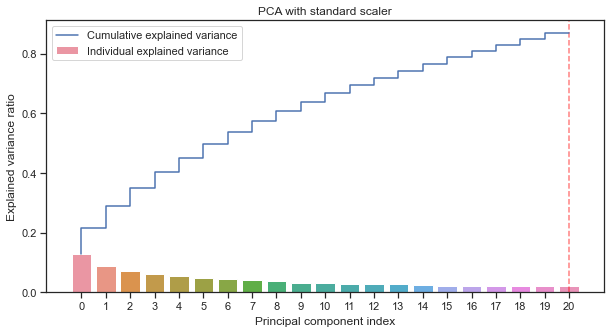

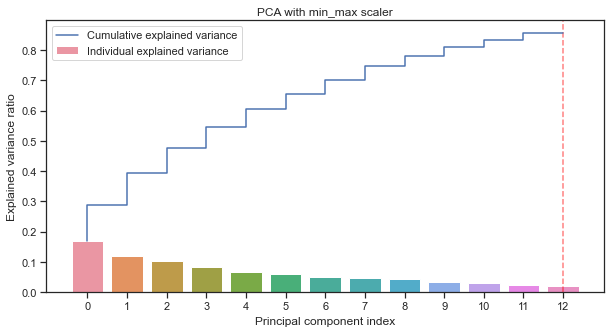

In [3]:
# Preprocess Data

X_data, y_data, y_labels = preprocess_data()

X_data_std, pipeline_std = preprocess_features(X_data, scaler_type="standard", plot_pca=True, n_components=21)
X_data_min, pipeline_min = preprocess_features(X_data, scaler_type="min_max", plot_pca=True, n_components=13)

In [4]:
# Create std estimators

std_estimators, mt_std = create_estimators(X_data_std, y_data, random_state=67)

Creating Basic Estimators...



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


avg. DecisionTreeClassifier(random_state=67) scores:
accuracy: 0.6280948200175593
precision: 0.63726990804278
recall: 0.6399917361580648
f1 score: 0.6352523590194066



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


avg. SVC(probability=True, random_state=67) scores:
accuracy: 0.7381474978050921
precision: 0.7604913175246198
recall: 0.7367681938675854
f1 score: 0.7430261483573702



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.6s finished


avg. RandomForestClassifier(random_state=67) scores:
accuracy: 0.690649692712906
precision: 0.7134821398848163
recall: 0.6853840540047436
f1 score: 0.6912439717104705

Tunning Hyperparams...

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best DecisionTreeClassifier estimator:
DecisionTreeClassifier(max_depth=10, max_features='log2', random_state=67)
F1 Score: 0.598095238095238

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best SVC estimator:
SVC(C=100, gamma=0.001, probability=True, random_state=67)
F1 Score: 0.7114285714285714

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best RandomForestClassifier estimator:
RandomForestClassifier(max_depth=6, max_features=None, random_state=67)
F1 Score: 0.5847619047619047

Boosting...

Boosted dt:
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Adaboost estimator:
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                      

In [5]:
# Create min_max estimators

min_estimators, mt_min = create_estimators(X_data_min, y_data, random_state=9999)

Creating Basic Estimators...

avg. DecisionTreeClassifier(random_state=9999) scores:
accuracy: 0.6009657594381036
precision: 0.6193976219111929
recall: 0.6073119975959733
f1 score: 0.6064186839840393



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


avg. SVC(probability=True, random_state=9999) scores:
accuracy: 0.7233538191395962
precision: 0.7376925860992296
recall: 0.7307775524002704
f1 score: 0.7299924816804786



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.3s finished


avg. RandomForestClassifier(random_state=9999) scores:
accuracy: 0.6697102721685689
precision: 0.6858881749168187
recall: 0.6767139959432049
f1 score: 0.6756446011111522

Tunning Hyperparams...

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best DecisionTreeClassifier estimator:
DecisionTreeClassifier(max_depth=1, max_features='log2', random_state=9999)
F1 Score: 0.6257142857142857

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best SVC estimator:
SVC(C=1000, gamma=0.0001, probability=True, random_state=9999)
F1 Score: 0.5961904761904762

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best RandomForestClassifier estimator:
RandomForestClassifier(max_depth=6, max_features=None, n_estimators=10,
                       random_state=9999)
F1 Score: 0.6676190476190476

Boosting...

Boosted dt:
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Adaboost estimator:
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
    

In [6]:
# Validate estimators

# get val set
X_val_std, y_val_std = get_x_y_set(mt_std)
X_val_min, y_val_min = get_x_y_set(mt_min)

In [7]:
# Show best std
best_std = get_n_best(std_estimators, X_val_std, y_val_std, y_labels, best_n=3)
print("Best Standard_scaled est:", best_std)

Best Standard_scaled est: [SVC(C=100, gamma=0.001, probability=True, random_state=67), SVC(probability=True, random_state=67), AdaBoostClassifier(base_estimator=RandomForestClassifier(max_depth=6,
                                                         max_features=None,
                                                         random_state=67),
                   learning_rate=0.01, n_estimators=500, random_state=67)]


In [8]:
# Show best min_max
best_min = get_n_best(min_estimators, X_val_min, y_val_min, y_labels, best_n=3)
print("Best Min_´Max_scaled est:", best_min)

Best Min_´Max_scaled est: [AdaBoostClassifier(base_estimator=SVC(C=1000, gamma=0.0001, probability=True,
                                      random_state=9999),
                   learning_rate=0.001, n_estimators=500, random_state=9999), SVC(probability=True, random_state=9999), SVC(C=1000, gamma=0.0001, probability=True, random_state=9999)]


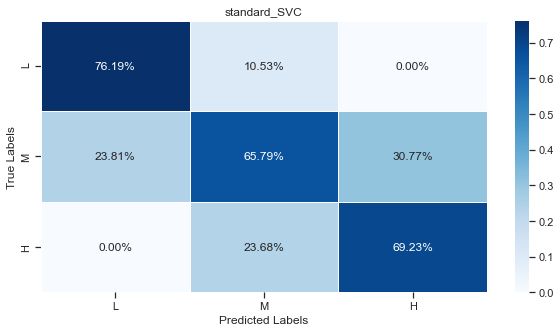

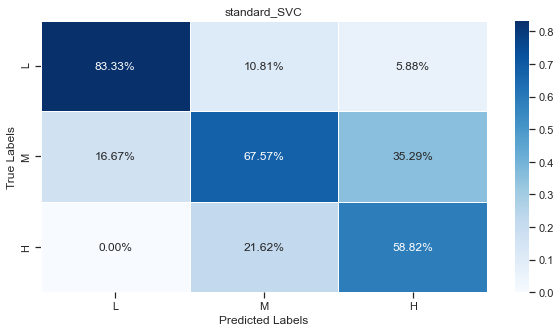

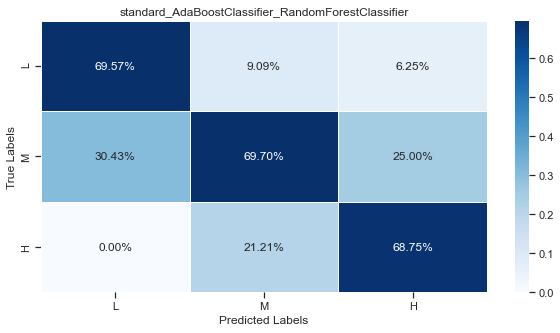

In [9]:
validate_estimators(best_std, X_val_std, y_val_std, y_labels,clas_report=False, scaler_type="standard")

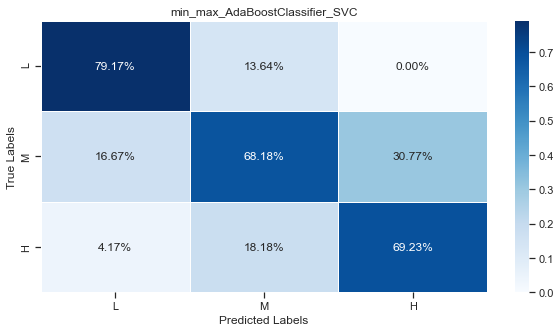

Classification Report: AdaBoostClassifier(base_estimator=SVC(C=1000, gamma=0.0001, probability=True,
                                      random_state=9999),
                   learning_rate=0.001, n_estimators=500, random_state=9999)
              precision    recall  f1-score   support

           L       0.69      0.78      0.73        23
           M       0.79      0.86      0.83        22
           H       0.68      0.56      0.61        27

    accuracy                           0.72        72
   macro avg       0.72      0.73      0.72        72
weighted avg       0.72      0.72      0.72        72



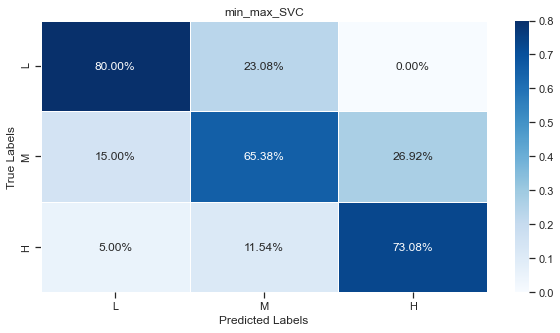

Classification Report: SVC(probability=True, random_state=9999)
              precision    recall  f1-score   support

           L       0.73      0.83      0.78        23
           M       0.80      0.73      0.76        22
           H       0.65      0.63      0.64        27

    accuracy                           0.72        72
   macro avg       0.73      0.73      0.73        72
weighted avg       0.72      0.72      0.72        72



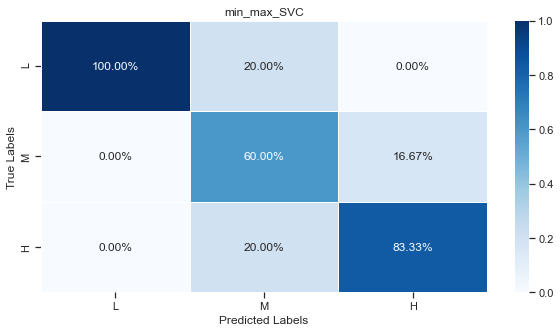

Classification Report: SVC(C=1000, gamma=0.0001, probability=True, random_state=9999)
              precision    recall  f1-score   support

           L       0.83      0.65      0.73        23
           M       1.00      0.64      0.78        22
           H       0.60      0.89      0.72        27

    accuracy                           0.74        72
   macro avg       0.81      0.73      0.74        72
weighted avg       0.80      0.74      0.74        72



In [84]:
validate_estimators(best_min, X_val_min, y_val_min, y_labels,clas_report=True, scaler_type="min_max")

In [11]:
# Save Models

save(best_std, suffix="std")
save(best_min, suffix="min_max")

File Saved as: SVC_std
File Saved as: SVC_std
File Saved as: AdaBoostClassifier_RandomForestClassifier_std
File Saved as: AdaBoostClassifier_SVC_min_max
File Saved as: SVC_min_max
File Saved as: SVC_min_max


In [12]:
# Save Pipelines

save(pipeline_std, file_name="pipeline_std")
save(pipeline_min, file_name="pipeline_min")

File Saved as: pipeline_std
File Saved as: pipeline_min


In [ ]:
# Load both pipelines
pipeline_std = load("pipeline_std")
pipeline_min = load("pipeline_min")

In [ ]:
# Load standard models
rf_std = load("RandomForestClassifier_std")
ada_svc_std = load("AdaBoostClassifier_SVC_std")
ada_rf_std = load("AdaBoostClassifier_RandomForestClassifier_std")

best_std = [rf_std, ada_svc_std, ada_rf_std]

In [ ]:
# Load min_max models
ada_svc_min = load("AdaBoostClassifier_SVC_min_max")
rf_min = load("RandomForestClassifier_min_max")
svc_min = load("SVC_min_max")

best_min = [ada_svc_min, rf_min, svc_min]

In [13]:
# Split raw data
X_data, y_data, y_labels = preprocess_data()

mt = ModelTuning(X_data, y_data, train_size=0.7, random_state=42)
X_val, y_val = get_x_y_set(mt)
X_train, y_train = get_x_y_set(mt, type="train")

In [51]:
LABELS=["H","L","M"]

array([2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 0, 2, 1, 1, 0, 2, 2, 2, 2, 0, 2, 2,
       2, 1, 1, 1, 2, 1, 2, 2, 0, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2,
       2, 1, 1, 0, 0, 2, 1, 1, 2, 0, 1, 1, 1, 1, 2, 2, 1, 2, 0, 2, 1, 1,
       2, 0, 0, 2, 1, 2, 1, 2, 1, 2, 2, 2, 1, 0, 1, 1, 1, 2, 0, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 0, 1, 1, 2, 1, 2, 0, 2, 2,
       0, 2, 1, 1, 1, 1, 2, 0, 2, 2, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 2,
       1, 1, 0, 0, 0, 2, 0, 2, 1, 1, 2, 0, 1, 2, 0, 2, 2, 0, 0, 2, 0, 1,
       2, 0, 2, 2, 1, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 1, 1, 2, 1,
       0, 2, 0, 2, 0, 1, 0, 2, 1, 0, 2, 2, 0, 2, 1, 1, 2, 2, 2, 2, 0, 0,
       1, 2, 0, 0, 2, 2, 1, 0, 2, 2, 2, 2, 0, 2, 0, 1, 1, 1, 2, 2, 0, 2,
       2, 2, 2, 0, 0, 2, 1, 1, 0, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 0, 0, 2,
       1, 2, 0, 2, 0, 2, 1, 2, 0, 1, 2, 1, 0, 0, 0, 2, 2, 1, 1, 2, 2, 2,
       2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2,
       0, 0, 2, 2, 1, 1, 0, 0, 2, 2, 0, 0, 2, 2, 1,

In [18]:
X_val.tail()

,RaisedHands,VisitedResources,AnnouncementsViewed,Discussion,Gender_F,Gender_M,Nationality_Jordan,Nationality_Kuwait,Nationality_Other,PlaceofBirth_Jordan,...,Semester_F,Semester_S,Relation_Father,Relation_Mother,Survey_No,Survey_Yes,ParentSatisfaction_Bad,ParentSatisfaction_Good,Absence_Above-7,Absence_Under-7
371,35,2,29,23,0,1,1,0,0,1,...,0,1,1,0,1,0,1,0,0,1
78,13,3,11,9,0,1,0,1,0,0,...,1,0,1,0,1,0,1,0,1,0
45,20,12,15,70,0,1,0,1,0,0,...,1,0,1,0,1,0,0,1,1,0
248,70,40,2,16,1,0,0,1,0,0,...,0,1,1,0,1,0,1,0,1,0
434,85,87,72,10,0,1,1,0,0,1,...,1,0,0,1,0,1,0,1,1,0


In [48]:
y_val

array([1, 2, 1, 0, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 0, 0, 2, 0, 1,
       2, 0, 2, 1, 2, 0, 0, 1, 2, 2, 2, 1, 2, 2, 2, 1, 0, 1, 1, 2, 2, 0,
       1, 2, 2, 2, 1, 2, 1, 0, 2, 0, 0, 2, 1, 1, 0, 2, 2, 2, 2, 2, 2, 0,
       2, 2, 1, 1, 1, 2])

In [54]:
# Create explainer for standard
exp = TabularExplainer(best_std, pipeline_std, X_train, y_train, X_val, LABELS)
y_labels

array(['L', 'M', 'H'], dtype=object)

In [56]:
print(f"True Class: {LABELS[y_val[0]]}")

True Class: L


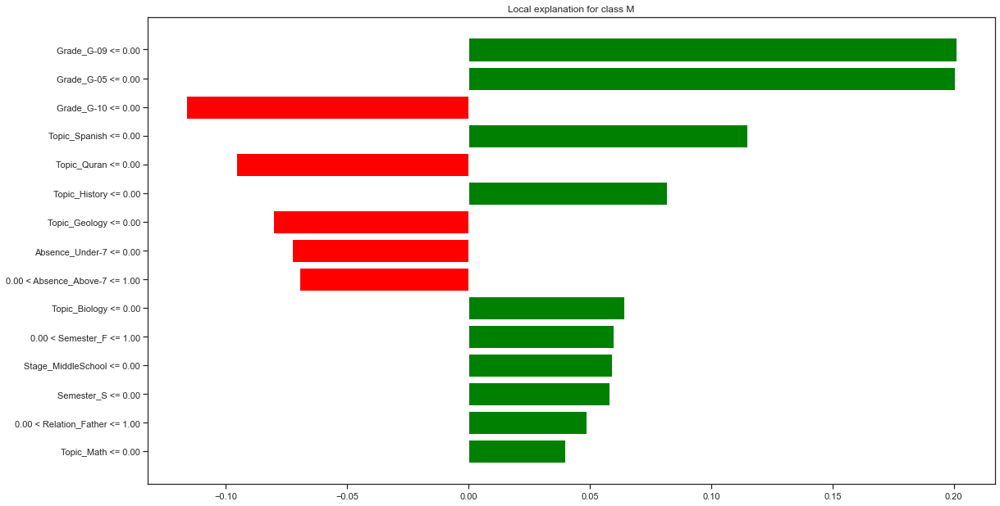

In [57]:
exp.explain(clf_index=0, data_index=0)

In [58]:
print(f"True Class: {LABELS[y_val[70]]}")

True Class: L


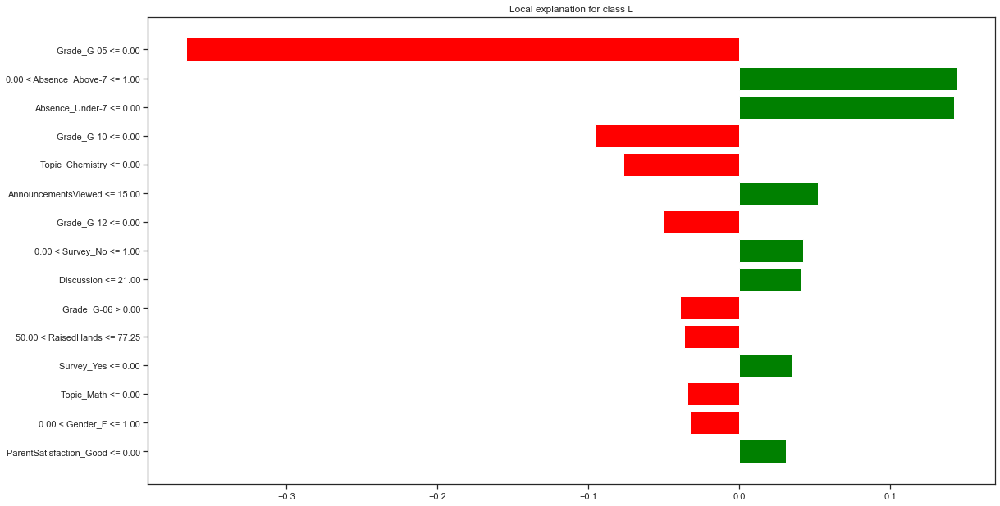

In [59]:
exp.explain(clf_index=1, data_index=70)

In [60]:
print(f"True Class: {LABELS[y_val[5]]}")

True Class: M


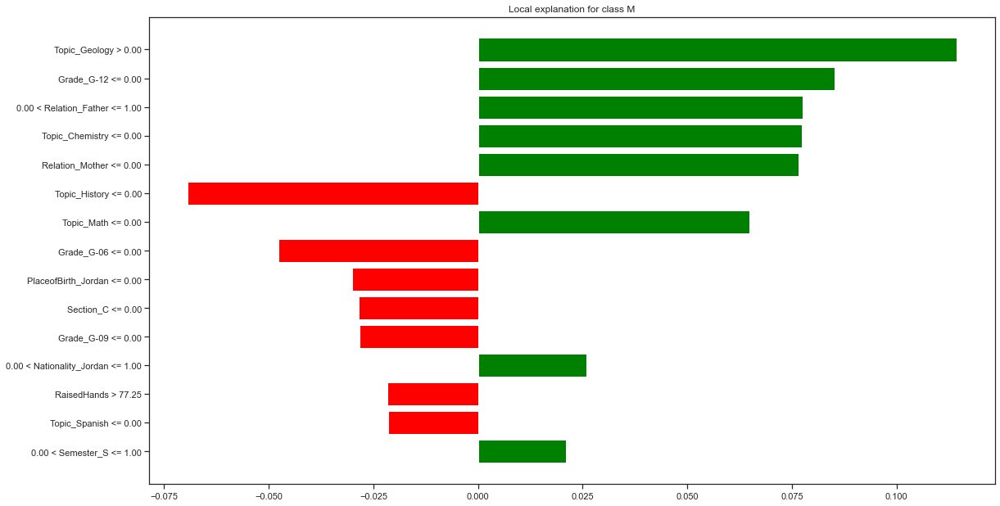

In [61]:
exp.explain(clf_index=2, data_index=5)

In [62]:
print(f"True Class: {LABELS[y_val[0]]}")

True Class: L


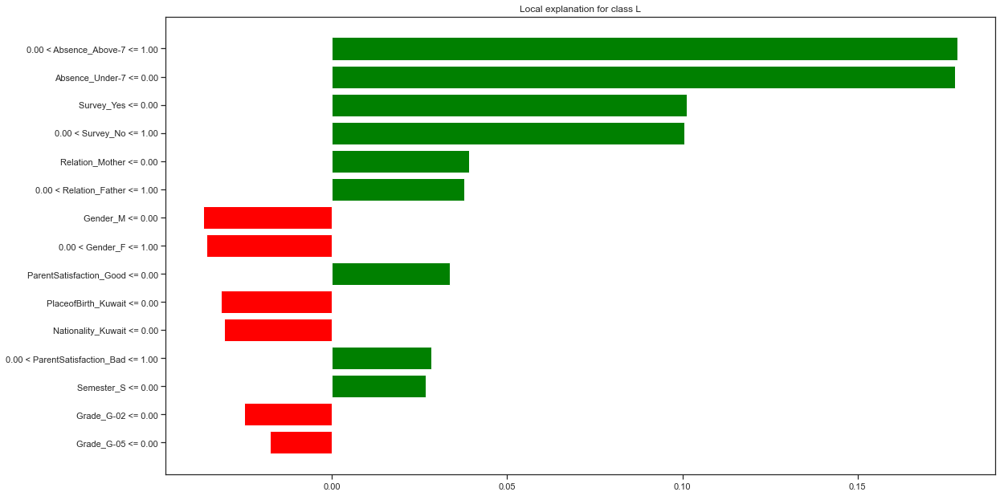

In [65]:
# Create explainer for min_max
exp = TabularExplainer(best_min, pipeline_min, X_train, y_train, X_val, LABELS)
exp.explain(clf_index=0, data_index=0)

In [66]:
print(f"True Class: {LABELS[y_val[70]]}")

True Class: L


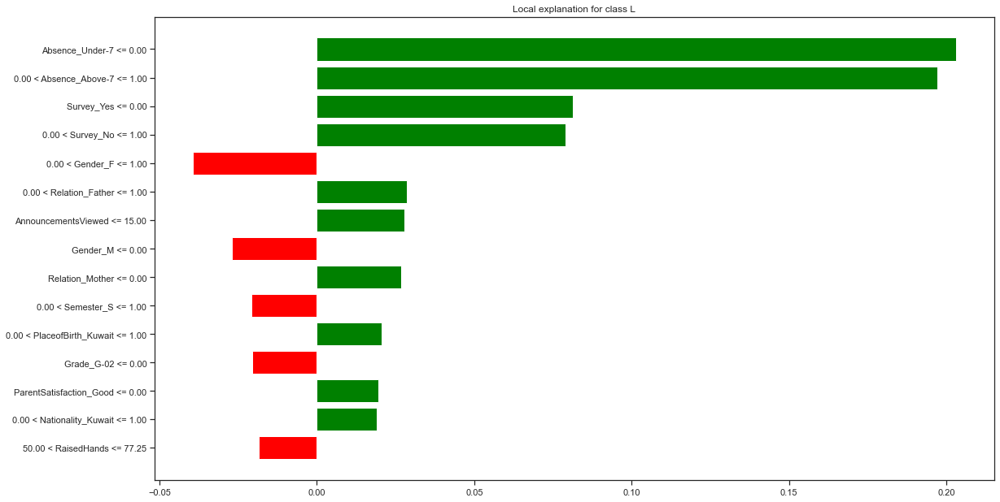

In [67]:
exp.explain(clf_index=1, data_index=70)

In [89]:
print(f"True Class: {LABELS[y_val[4]]}")

True Class: L


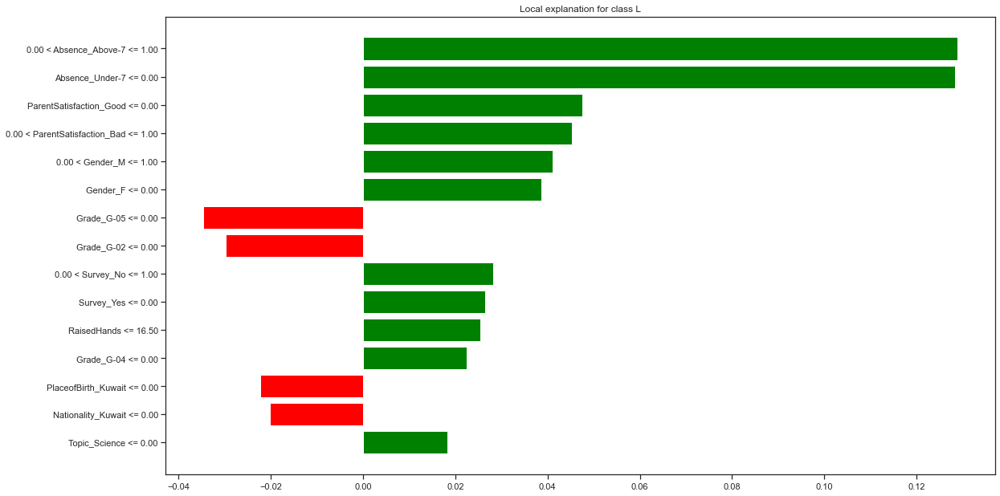

In [88]:
exp.explain(clf_index=2, data_index=2)